# Chapter 7: Image Enhancements using Derivatives 

## Image derivatives – Gradient and Laplacian

In [1]:
%matplotlib inline
from scipy import signal, misc, ndimage
from scipy.signal import convolve2d
from skimage import filters, feature, img_as_float
from skimage.util import random_noise
from skimage.filters import gaussian, laplace
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.transform import pyramid_gaussian, pyramid_laplacian
from skimage.transform import pyramid_reduce, pyramid_laplacian, pyramid_expand, resize
from PIL import Image, ImageFilter
from PIL.ImageFilter import (FIND_EDGES, EDGE_ENHANCE, EDGE_ENHANCE_MORE)
from scipy.ndimage import gaussian_filter
from numpy import pi
import matplotlib.pylab as plt
import numpy as np
import warnings
warnings.filterwarnings('ignore')

### Derivatives and gradients

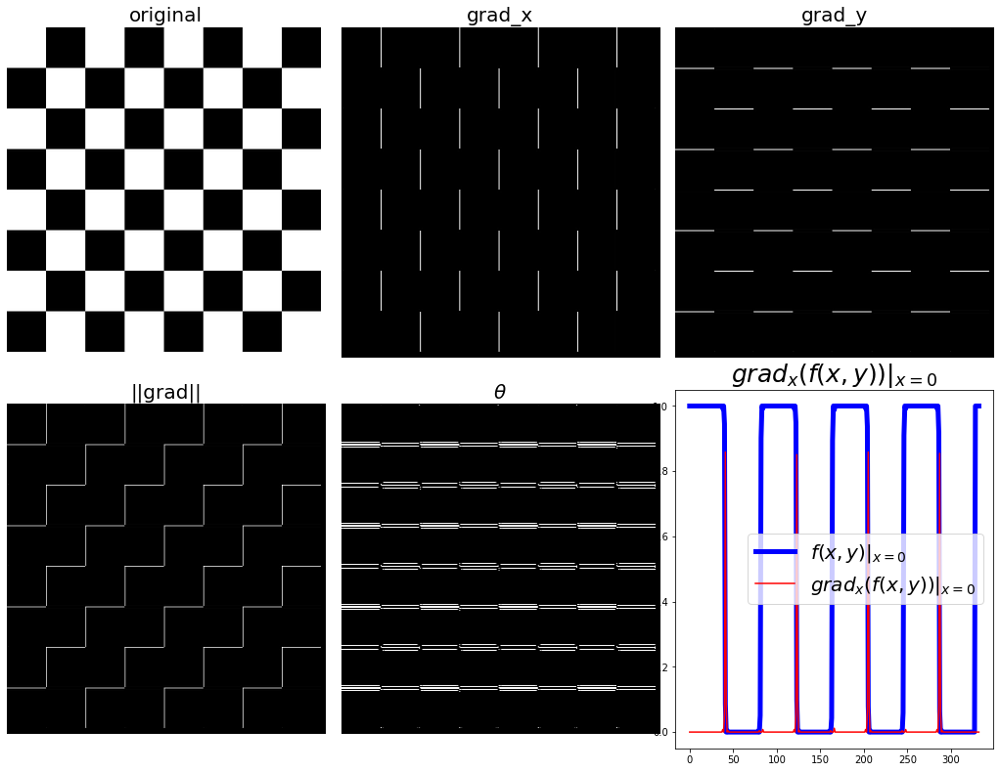

In [13]:
def plot_image(image, title):
    plt.imshow(image), plt.title(title, size=20), plt.axis('off')

def plot_all_images(im, im_x, im_y, im_mag, im_dir):
    plt.figure(figsize=(14,11))
    plt.gray()
    plt.subplots_adjust(0,0,1,0.95,0.05,0.05)
    plt.subplot(231), plot_image(im, 'original')
    plt.subplot(232), plot_image(im_x, 'grad_x')
    plt.subplot(233), plot_image(im_y, 'grad_y')
    plt.subplot(234), plot_image(im_mag, '||grad||')
    plt.subplot(235), plot_image(im_dir, r'$\theta$')
    plt.subplot(236)
    plt.plot(range(im.shape[1]), im[0,:], 'b-', label=r'$f(x,y)|_{x=0}$', linewidth=5)
    plt.plot(range(im.shape[1]), im_x[0,:], 'r-', label=r'$grad_x (f(x,y))|_{x=0}$')
    plt.title(r'$grad_x (f(x,y))|_{x=0}$', size=25)
    plt.legend(prop={'size': 20})
    plt.show()
    
def compute_grads(im):
    im_x = np.clip(signal.convolve2d(im, ker_x, mode='same'), 0, 1)
    im_y = np.clip(signal.convolve2d(im, ker_y, mode='same'), 0, 1)
    im_mag = np.sqrt(im_x**2 + im_y**2)
    im_dir = np.arctan(im_y / (im_x + eps))
    return im_x, im_y, im_mag, im_dir
    
eps = 1e-6
ker_x = [[-1, 1]]
ker_y = [[-1], [1]]
im = rgb2gray(imread('images/chess.png'))
im_x, im_y, im_mag, im_dir = compute_grads(im)
plot_all_images(im, im_x, im_y, im_mag, im_dir)

### Displaying the magnitude and the gradient on the same image

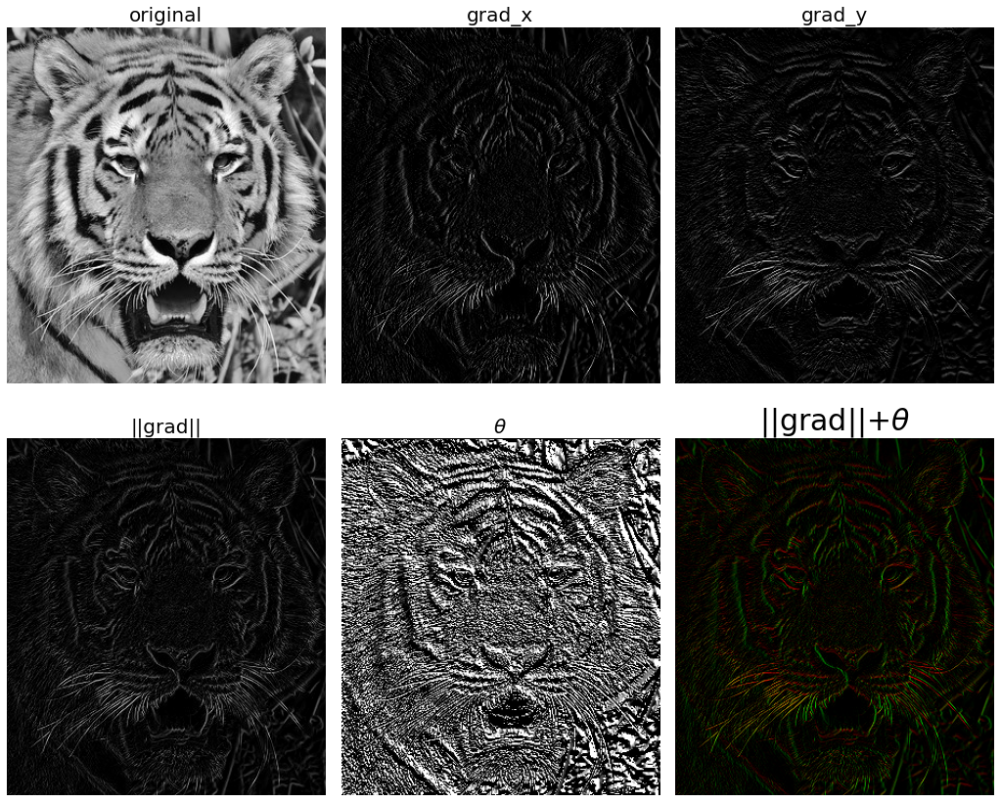

In [12]:
def plot_all_images_with_col_grad(im, im_x, im_y, im_mag, im_ang):
    plt.figure(figsize=(14,12))
    plt.gray()
    plt.subplots_adjust(0,0,1,0.95,0.05,0.05)
    plt.subplot(231), plot_image(im, 'original')
    plt.subplot(232), plot_image(im_x, 'grad_x')
    plt.subplot(233), plot_image(im_y, 'grad_y')
    plt.subplot(234), plot_image(im_mag, '||grad||')
    plt.subplot(235), plot_image(im_ang, r'$\theta$')
    plt.subplot(236)
    im = np.zeros((im.shape[0],im.shape[1],3))
    im[...,0] = im_mag*np.sin(im_ang)
    im[...,1] = im_mag*np.cos(im_ang)
    plt.imshow((im)), plt.title(r'||grad||+$\theta$', size=30), plt.axis('off')
    plt.show()
    

im = rgb2gray(imread('images/tiger.jpg'))
im_x, im_y, im_mag, im_dir = compute_grads(im)
plot_all_images_with_col_grad(im, im_x, im_y, im_mag, im_dir)

## The Laplacian

### Some notes about the Laplacian

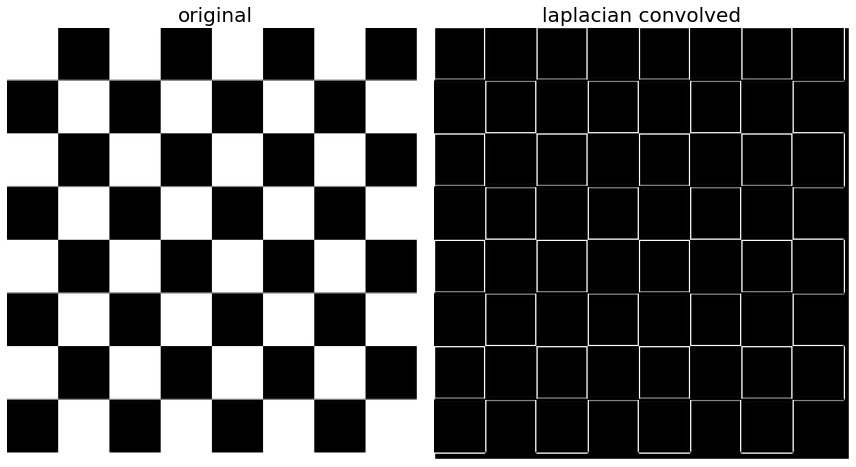

In [11]:
ker_laplacian = [[0,-1,0],[-1, 4, -1],[0,-1,0]]
im = rgb2gray(imread('images/chess.png'))
im1 = np.clip(signal.convolve2d(im, ker_laplacian, mode='same'),0,1)
plt.figure(figsize=(12,7))
plt.subplot(121), plot_image(im, 'original')
plt.subplot(122), plot_image(im1, 'laplacian convolved')
plt.tight_layout()
plt.show()

### Effects of noise on gradient computation

1.0


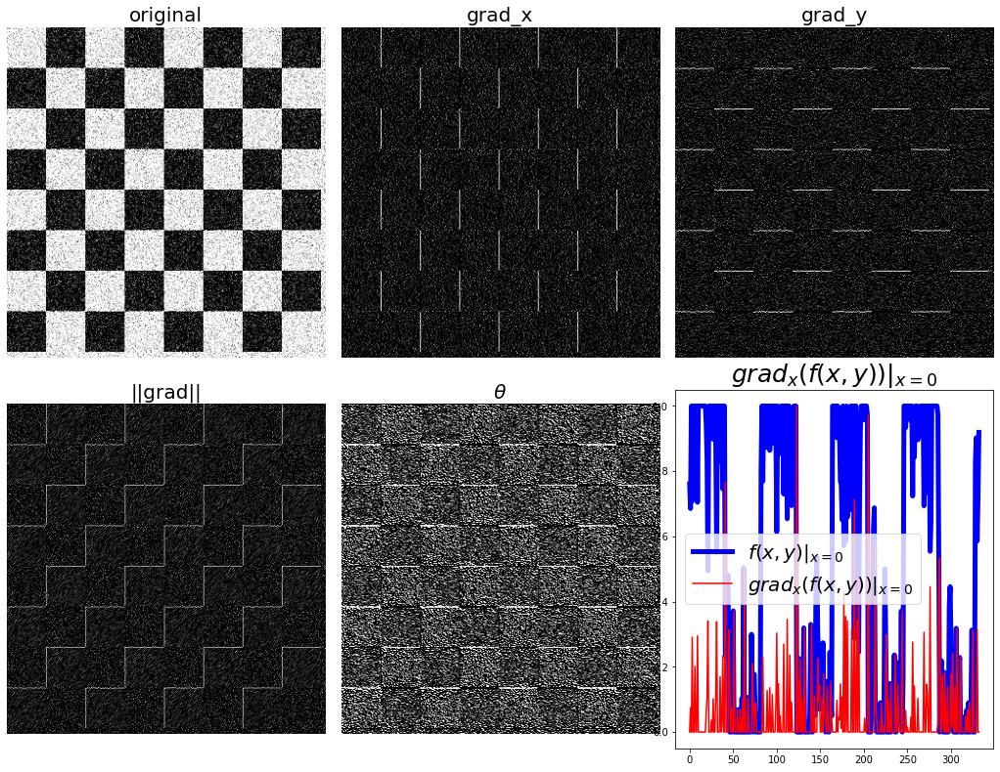

In [14]:
im = rgb2gray(imread('images/chess.png'))
sigma = 0.25
im = random_noise(im, var=sigma**2)
print(np.max(im))
im_x, im_y, im_mag, im_dir = compute_grads(im)
plot_all_images(im, im_x, im_y, im_mag, im_dir)

### Sharpening and unsharp masking

### Sharpening with Laplacian

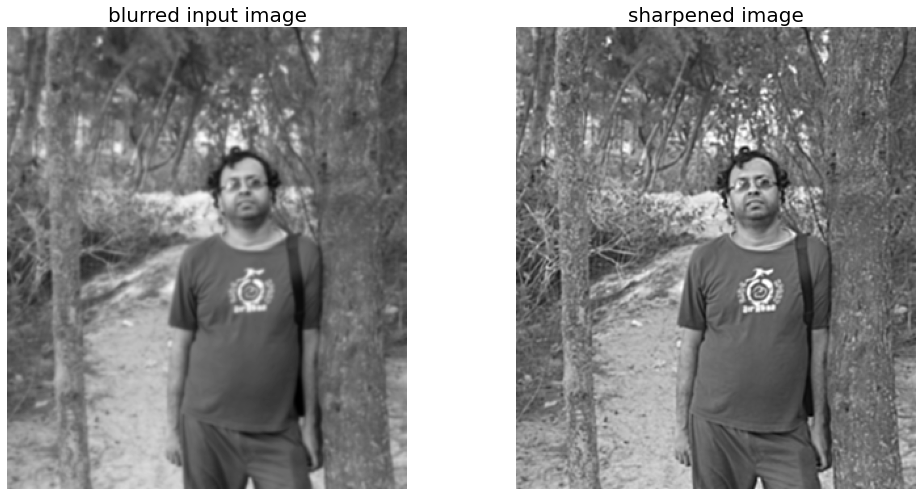

In [25]:
im = gaussian(rgb2gray(imread('images/me.jpeg')), sigma=1)
im1 = np.clip(laplace(im) + im, 0, 1)
plt.figure(figsize=(15,7))
plt.subplot(121), plot_image(im, 'blurred input image')
plt.subplot(122), plot_image(im1, 'sharpened image')
plt.tight_layout()
plt.show()

### Unsharp masking

### With `PIL.ImageFilter` module

In [2]:
## ToDo

### With `scipy.ndimage` module

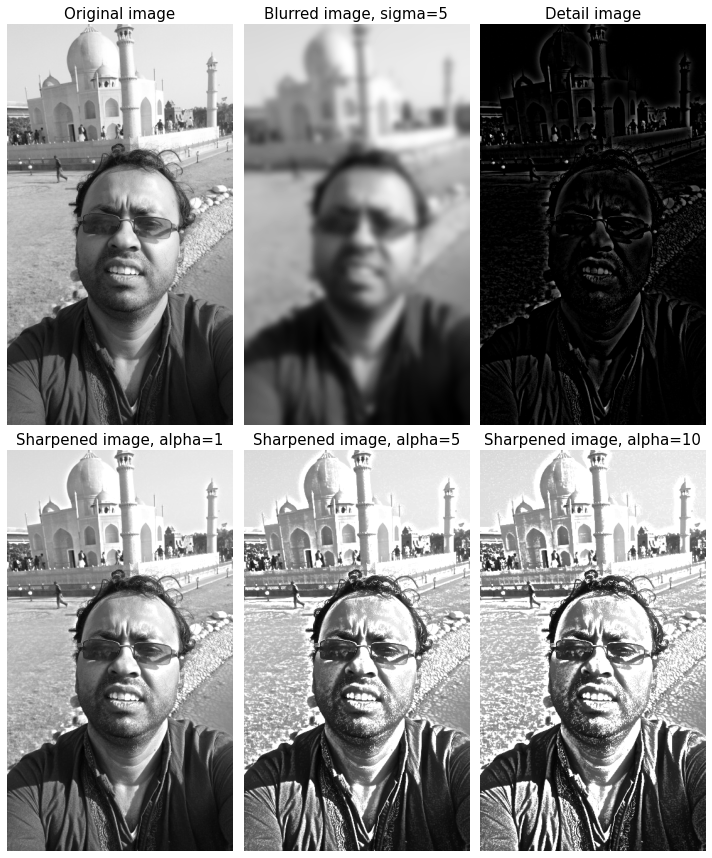

In [30]:
def rgb2gray(im):
    '''
    the input image is an RGB image
    with pixel values for each channel in [0,1]
    '''
    return np.clip(0.2989 * im[...,0] + 0.5870 * im[...,1] + 0.1140 * im[...,2], 0, 1)

im = rgb2gray(img_as_float(plt.imread('images/me.jpg')))
im_blurred = ndimage.gaussian_filter(im, 5)
im_detail = np.clip(im - im_blurred, 0, 1)
fig, axes = plt.subplots(nrows=2, ncols=3, sharex=True, sharey=True, figsize=(10, 12))
plt.gray()
axes = axes.ravel()
axes[0].set_title('Original image', size=15), axes[0].imshow(im)
axes[1].set_title('Blurred image, sigma=5', size=15),
axes[1].imshow(im_blurred)
axes[2].set_title('Detail image', size=15), axes[2].imshow(im_detail)
alpha = [1, 5, 10]
for i in range(3):
    im_sharp = np.clip(im + alpha[i]*im_detail, 0, 1)
    axes[3+i].imshow(im_sharp), axes[3+i].set_title('Sharpened image, alpha=' + str(alpha[i]), size=15)
for ax in axes:
    ax.axis('off')
fig.tight_layout()
plt.show()

## Edge detection using derivatives and filters (Sobel, Canny, and so on)

### With gradient magnitude computed using the partial derivatives     

In [4]:
## ToDo

### The non-maximum suppression algorithm

In [5]:
## ToDo

### Sobel edge detector with scikit-image

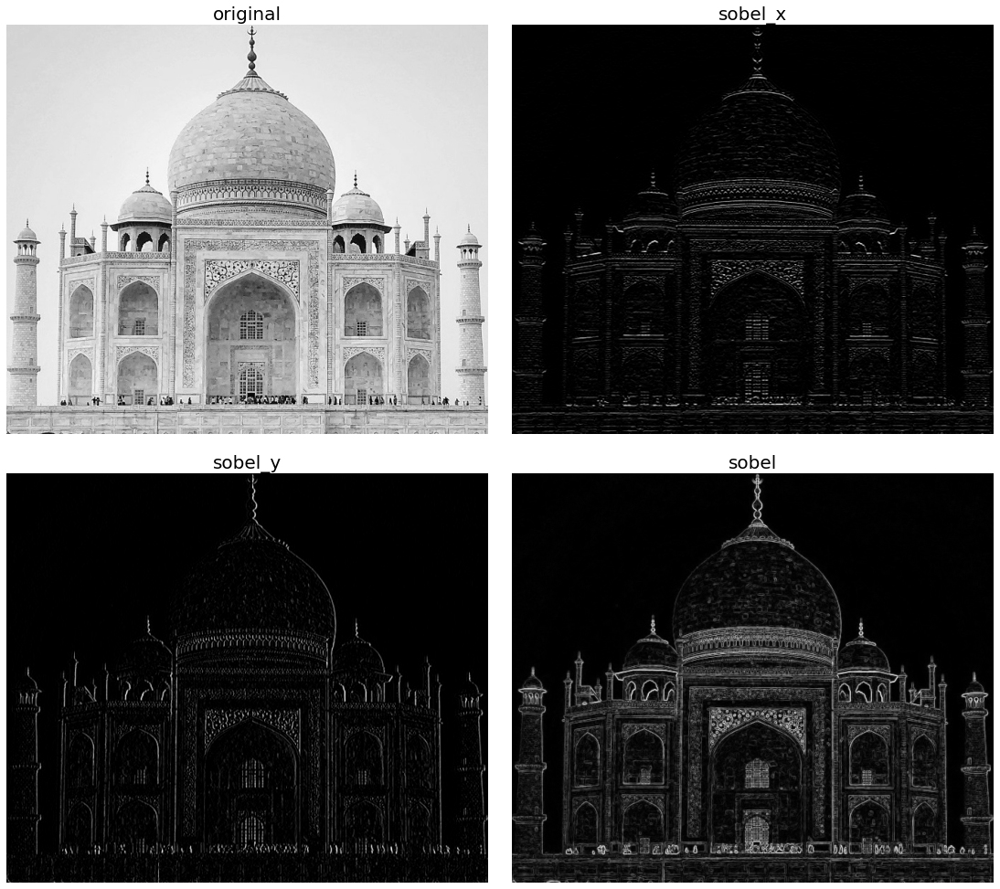

In [45]:
im = imread('images/tajmahal.jpg', as_gray=True) # RGB image to gray scale
edges_x, edges_y = filters.sobel_h(im), filters.sobel_v(im)
edges = filters.sobel(im)

plt.figure(figsize=(15,14))
plt.gray()
plt.subplot(221), plot_image(im, 'original')
plt.subplot(222), plot_image(np.clip(edges_x,0,1), 'sobel_x')
plt.subplot(223), plot_image(np.clip(edges_y,0,1), 'sobel_y')
plt.subplot(224),  plot_image(np.clip(edges,0,1), 'sobel')
plt.subplots_adjust(0,0,1,0.95,0.05,0.05)
plt.show()

### Different edge detectors with scikit-image – Prewitt, Roberts, Sobel, Scharr, and Laplace

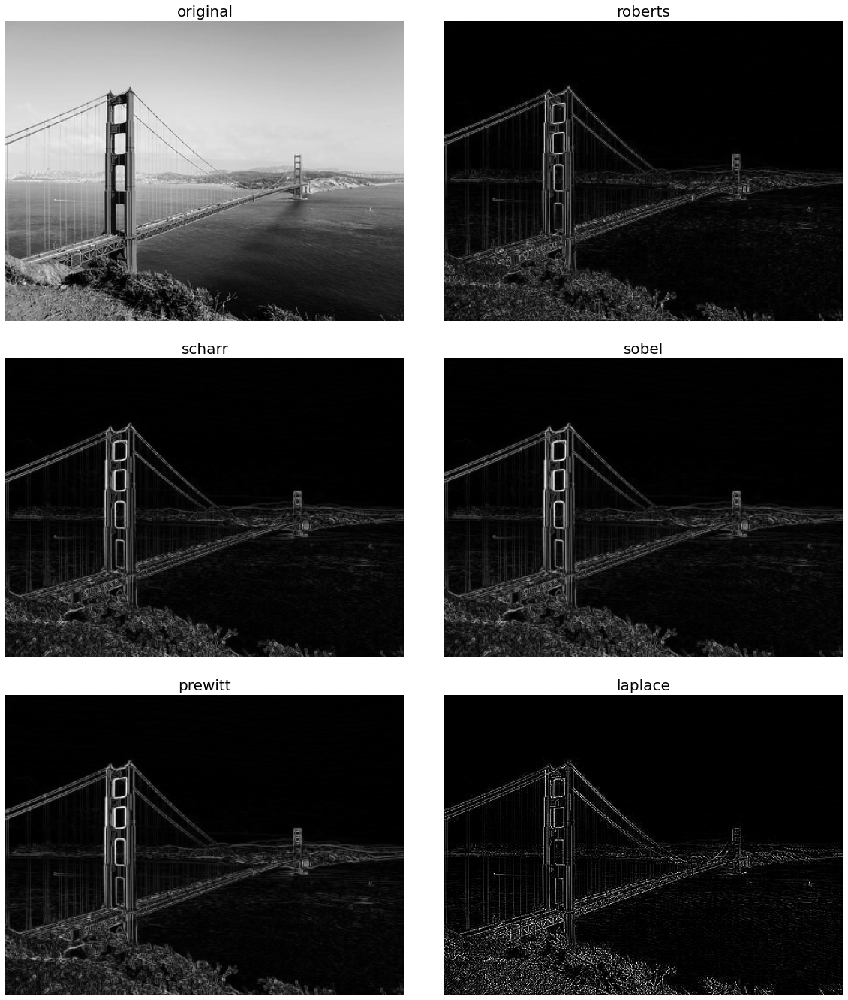

In [49]:
im = imread('images/goldengate.jpg', as_gray=True) # RGB image to gray scale
plt.figure(figsize=(20,24))
plt.gray()
plt.subplot(321), plot_image(im, 'original')
edges = filters.roberts(im)
plt.subplot(322), plot_image(edges, 'roberts')
edges = filters.scharr(im)
plt.subplot(323), plot_image(edges, 'scharr')
edges = filters.sobel(im)
plt.subplot(324), plot_image(edges, 'sobel')
edges = filters.prewitt(im)
plt.subplot(325), plot_image(edges, 'prewitt')
edges = np.clip(filters.laplace(im), 0, 1)
plt.subplot(326), plot_image(edges, 'laplace')
plt.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

### The Canny edge detector with scikit-image

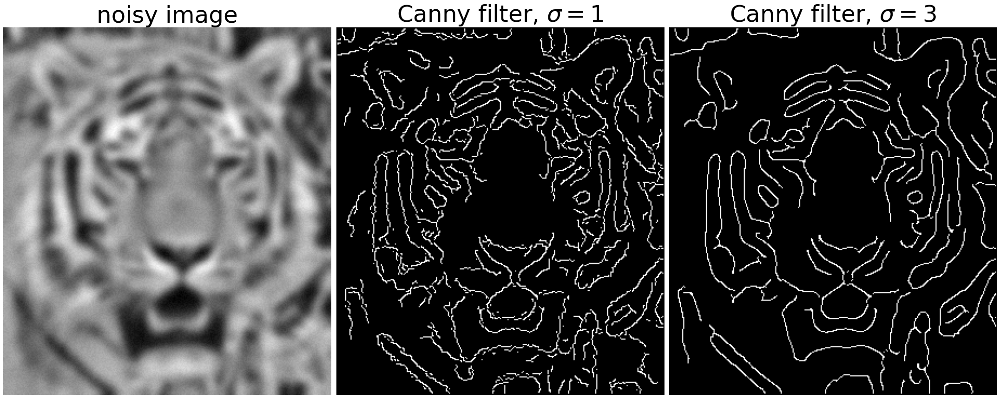

In [53]:
im = imread('images/tiger.jpg', as_gray=True)
im = ndimage.gaussian_filter(im, 4)
im += 0.05 * np.random.random(im.shape)
edges1 = feature.canny(im)
edges2 = feature.canny(im, sigma=2)
fig, (axes1, axes2, axes3) = plt.subplots(nrows=1, ncols=3, figsize=(30, 12), sharex=True, sharey=True)
axes1.imshow(im, cmap=plt.cm.gray), axes1.axis('off'),
axes1.set_title('noisy image', fontsize=50)
axes2.imshow(edges1, cmap=plt.cm.gray), axes2.axis('off')
axes2.set_title('Canny filter, $\sigma=1$', fontsize=50)
axes3.imshow(edges2, cmap=plt.cm.gray), axes3.axis('off')
axes3.set_title('Canny filter, $\sigma=3$', fontsize=50)
fig.tight_layout()
plt.show()

### The LoG and DoG filters

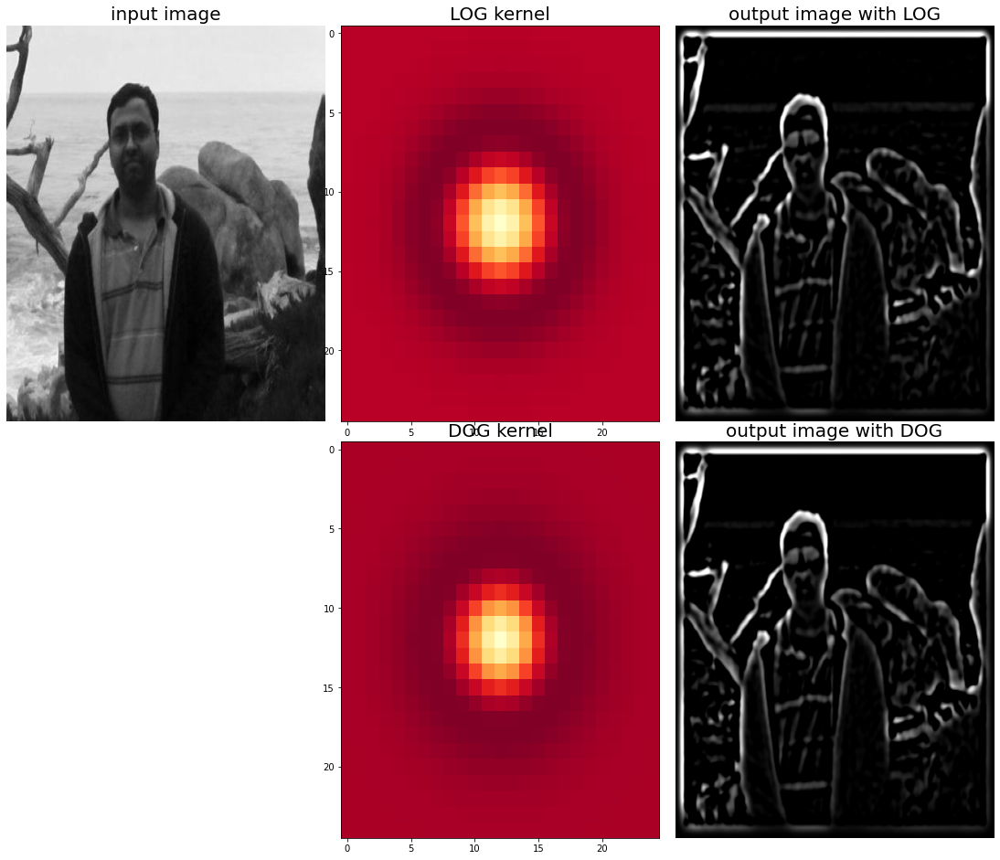

In [63]:
def plot_kernel(kernel, s, name):
    plt.imshow(kernel, cmap='YlOrRd', aspect='auto')

def LOG(k=12, s=3):
    n = 2*k+1 # size of the kernel
    kernel = np.zeros((n,n))
    for i in range(n):
        for j in range(n):
            kernel[i,j] = -(1-((i-k)**2+(j-k)**2)/(2.*s**2))*np.exp(-((i-k)**2+(j-k)**2)/(2.*s**2))/(pi*s**4)
    kernel = np.round(kernel / np.sqrt((kernel**2).sum()),3)
    return kernel

def DOG(k=12, s=3):
    n = 2*k+1 # size of the kernel
    s1, s2 = s * np.sqrt(2), s / np.sqrt(2)
    kernel = np.zeros((n,n))
    for i in range(n):
        for j in range(n):
            kernel[i,j] = np.exp(-((i-k)**2+(j-k)**2)/(2.*s1**2))/(2*pi*s1**2) - np.exp(-((i-k)**2+(j-k)**2)/(2.*s2**2))/(2*pi*s2**2)
    kernel = np.round(kernel / np.sqrt((kernel**2).sum()),3)
    return kernel

s = 3 # sigma value for LoG
img = rgb2gray(imread('images/me_sea.jpg'))
kernel = LOG()
outimg = convolve2d(img, kernel)
plt.figure(figsize=(15,13))
plt.subplots_adjust(0,0,1,0.95,0.05,0.05)
plt.subplot(231), plt.imshow(img, aspect='auto'), plt.axis('off'), plt.title('input image', size=20)
plt.subplot(232), plt.title('LOG kernel', size=20), plot_kernel(kernel, s, 'DOG')
plt.subplot(233), plt.title('output image with LOG', size=20)
plt.imshow(np.clip(outimg,0,1), cmap='gray', aspect='auto'), plt.axis('off') # clip the pixel values in between 0 and 1
kernel = DOG()
outimg = convolve2d(img, DOG())
plt.subplot(235), plt.title('DOG kernel', size=20), plot_kernel(kernel, s, 'DOG')
plt.subplot(236), plt.title('output image with DOG', size=20)
plt.imshow(np.clip(outimg,0,1), cmap='gray', aspect='auto'), plt.axis('off') 
plt.show()    

### The LoG filter with the `scipy.ndimage` module

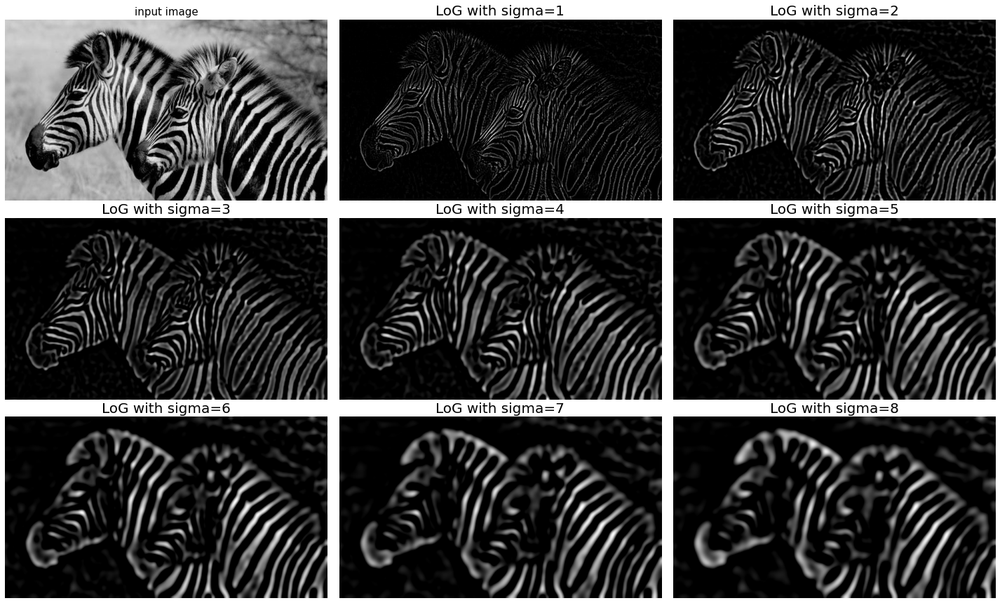

In [66]:
img = rgb2gray(imread('images/zebras.jpg'))
fig = plt.figure(figsize=(20,12))
plt.gray() # show the filtered result in grayscale
plt.subplot(331), plt.imshow(img), plt.axis('off'), plt.title('input image', size=15)
for sigma in range(1,9):
    plt.subplot(3,3,sigma+1)
    img_log = ndimage.gaussian_laplace(img, sigma=sigma)
    plt.imshow(np.clip(img_log,0,1)), plt.axis('off')
    plt.title('LoG with sigma=' + str(sigma), size=20)
plt.tight_layout()
plt.show()

### Edge detection with the LoG filter

### Edge detection with the Marr and Hildreth's algorithm using the zero-crossing computation

In [ ]:
def zero_crossing(img):
    '''implement the function here''' # left as an exercise
    return None

fig = plt.figure(figsize=(25,15))
plt.gray() # show the filtered result in grayscale
for sigma in range(2,10, 2):
    plt.subplot(2,2,sigma/2)
    result = ndimage.gaussian_laplace(img, sigma=sigma)
    plt.imshow(zero_crossing(result)) # implement the function zero_crossing() using the above algorithm
    plt.axis('off')
    plt.title('LoG with zero-crossing, sigma=' + str(sigma), size=20)
plt.show()

### Finding and enhancing edges with PIL

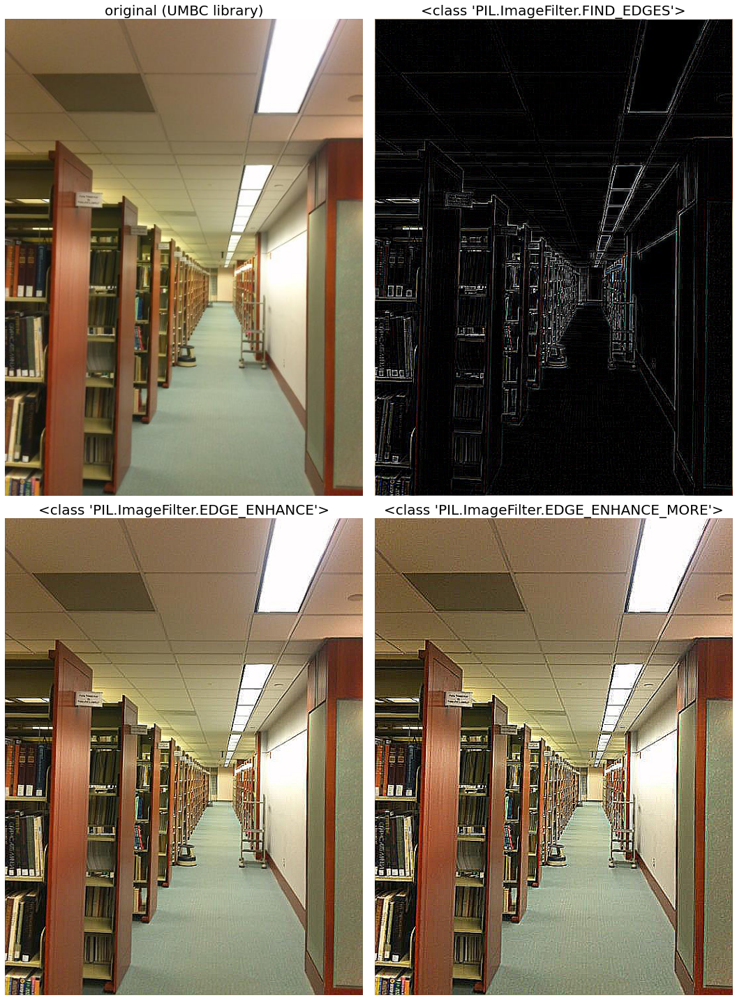

In [68]:
im = Image.open('images/umbc_lib.jpg')
plt.figure(figsize=(15,20))
plt.subplot(2,2,1)
plot_image(im, 'original (UMBC library)')
i = 2
for f in (FIND_EDGES, EDGE_ENHANCE, EDGE_ENHANCE_MORE):
    plt.subplot(2,2,i)
    im1 = im.filter(f)
    plot_image(im1, str(f))
    i += 1
plt.tight_layout()
plt.show()

## Image pyramids (Gaussian and Laplacian) – blending images

### A Gaussian pyramid with scikit-image transform pyramid module

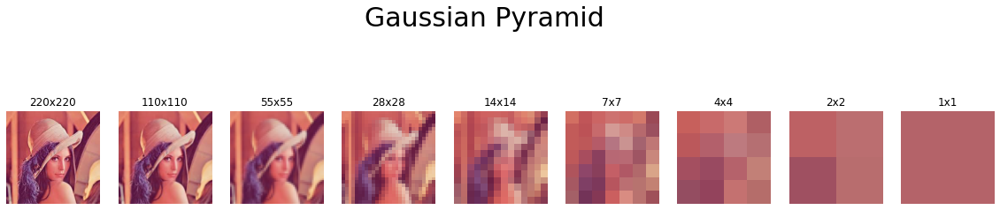

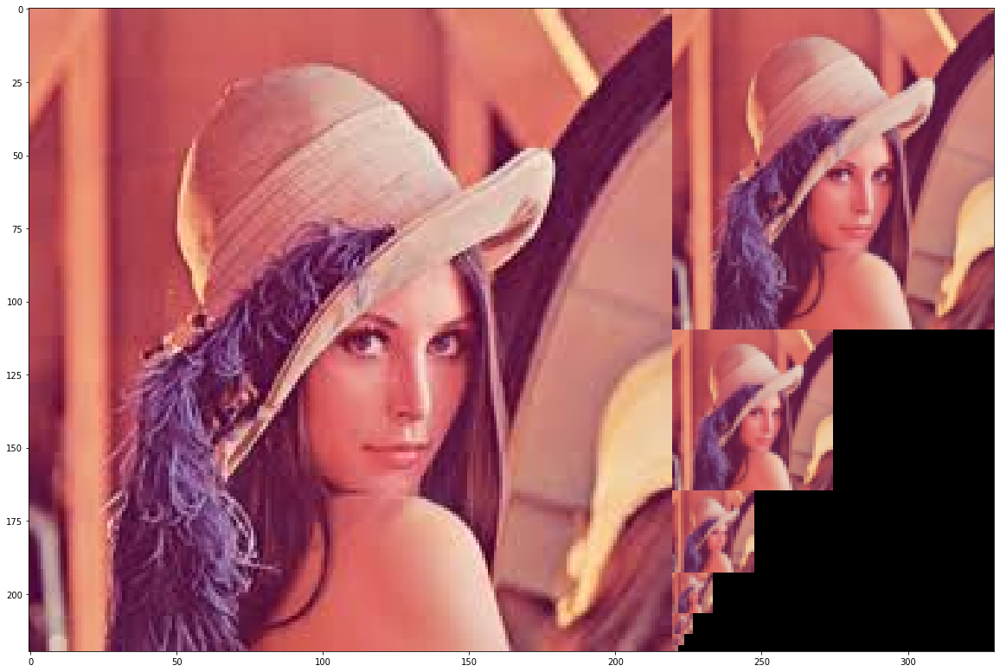

In [72]:
image = imread('images/lena.jpg')
nrows, ncols = image.shape[:2]
pyramid = tuple(pyramid_gaussian(image, downscale=2, multichannel=True))

plt.figure(figsize=(20,5))
i, n = 1, len(pyramid)
for p in pyramid:
    plt.subplot(1,n,i), plt.imshow(p),  plt.title(str(p.shape[0]) + 'x' + str(p.shape[1])), plt.axis('off')
    i += 1
plt.suptitle('Gaussian Pyramid', size=30)
plt.show()

compos_image = np.zeros((nrows, ncols + ncols // 2, 3), dtype=np.double)
compos_image[:nrows, :ncols, :] = pyramid[0]

i_row = 0
for p in pyramid[1:]:
    n_rows, n_cols = p.shape[:2]
    compos_image[i_row:i_row + n_rows, ncols:ncols + n_cols] = p
    i_row += n_rows

fig, ax = plt.subplots(figsize=(20,20))
ax.imshow(compos_image)
plt.show()

### A Laplacian pyramid with scikit-image transform's pyramid module

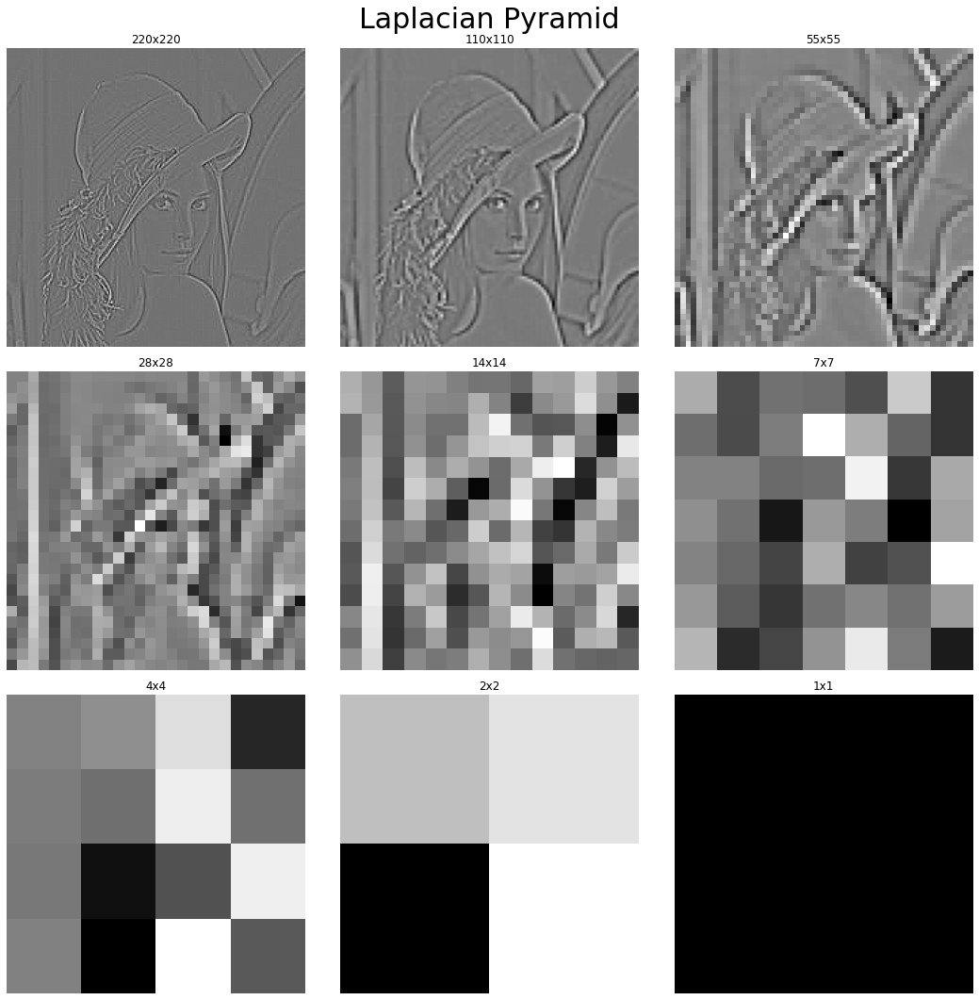

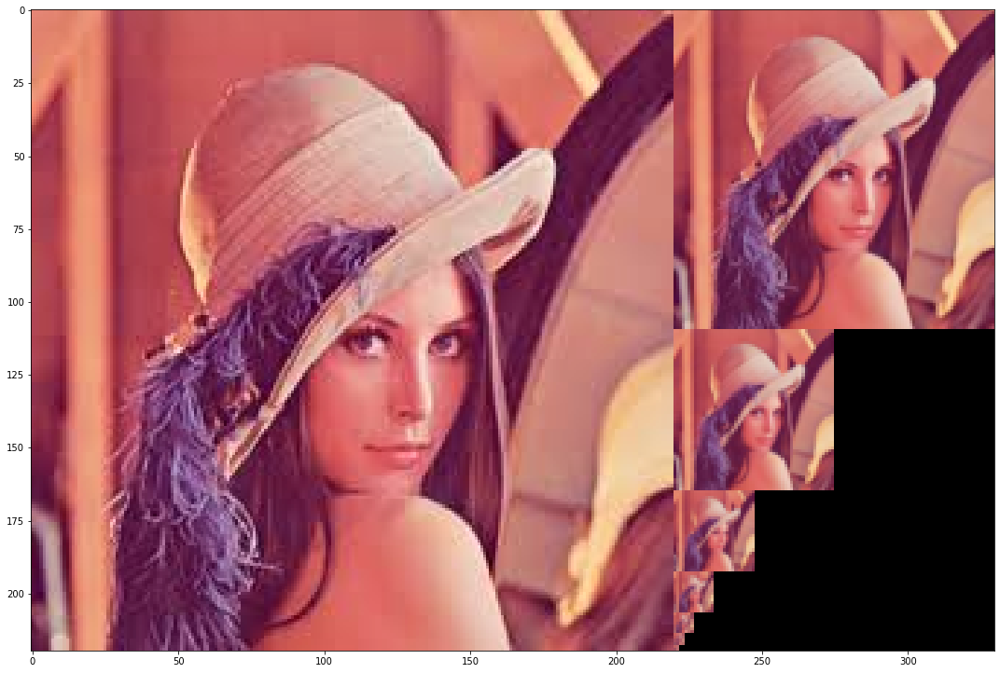

In [80]:
image = imread('images/lena.jpg')
#image = imread('../new images/orange.png')[...,:3]
nrows, ncols = image.shape[:2]
pyramid = tuple(pyramid_laplacian(image, downscale=2, multichannel=True))

plt.figure(figsize=(15,15))
i, n = 1, len(pyramid)
for p in pyramid:
    plt.subplot(3,3,i), plt.imshow(rgb2gray(p), cmap='gray'), plt.title(str(p.shape[0]) + 'x' + str(p.shape[1]))
    plt.axis('off')
    i += 1
plt.suptitle('Laplacian Pyramid', size=30)
plt.tight_layout()
plt.show()

composite_image = np.zeros((nrows, ncols + ncols // 2), dtype=np.double)

composite_image[:nrows, :ncols] = rgb2gray(pyramid[0])

i_row = 0
for p in pyramid[1:]:
    n_rows, n_cols = p.shape[:2]
    composite_image[i_row:i_row + n_rows, ncols:ncols + n_cols] = rgb2gray(p)
    i_row += n_rows

fig, ax = plt.subplots(figsize=(15,15))
ax.imshow(compos_image, cmap='gray')
plt.tight_layout()
plt.show()

### Constructing the Gaussian Pyramid with scikitimage transform module's reduce function, and the Laplacian Pyramid from the Gaussian Pyramid and the expand function

In [2]:
#! pip install -U scikit-image
import skimage
print(skimage.__version__)

0.19.3


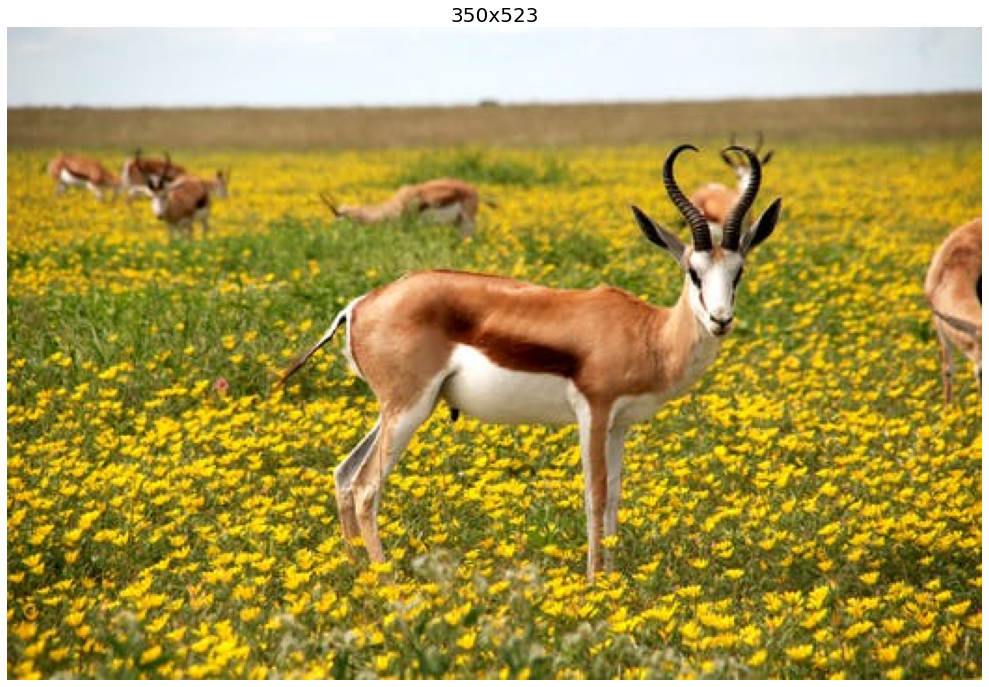

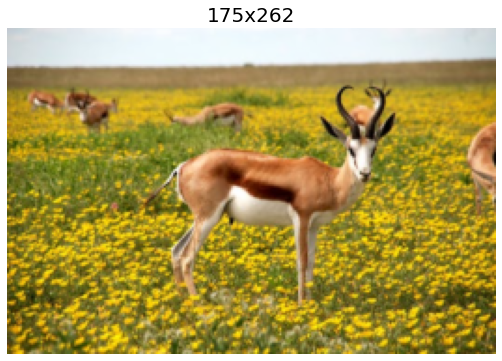

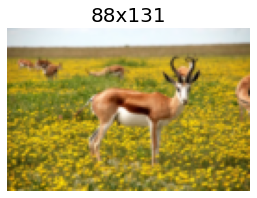

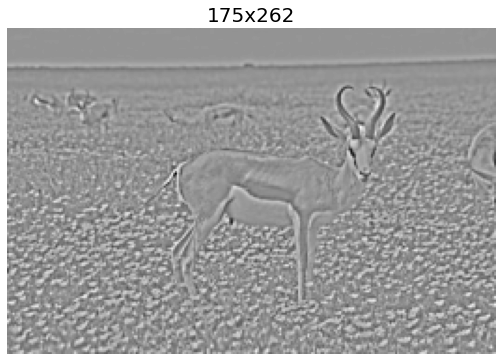

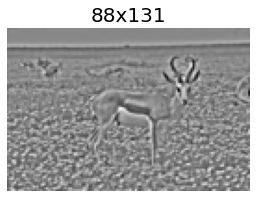

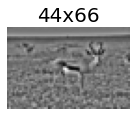

In [3]:
image = imread('images/antelops.jpeg')

def get_gaussian_pyramid(image):
    rows, cols, dim = image.shape
    gaussian_pyramid = [image]
    while rows > 1 and cols > 1:
        #print(rows, cols)
        image = pyramid_reduce(image, downscale=2, channel_axis=2)
        gaussian_pyramid.append(image)
        #print(image.shape)
        rows //= 2
        cols //= 2
    return gaussian_pyramid

def get_laplacian_pyramid(gaussian_pyramid):
    laplacian_pyramid = [gaussian_pyramid[len(gaussian_pyramid)-1]]
    for i in range(len(gaussian_pyramid)-2, -1, -1):
        image = gaussian_pyramid[i] - resize(pyramid_expand(gaussian_pyramid[i+1], channel_axis=2), gaussian_pyramid[i].shape)
        #print(i, image.shape)
        laplacian_pyramid.append(np.copy(image))
    laplacian_pyramid = laplacian_pyramid[::-1]
    return laplacian_pyramid


gaussian_pyramid = get_gaussian_pyramid(image)
laplacian_pyramid = get_laplacian_pyramid(gaussian_pyramid)
    
w, h = 20, 12
for i in range(3):
    plt.figure(figsize=(w,h))
    p = gaussian_pyramid[i]
    plt.imshow(p)
    plt.title(str(p.shape[0]) + 'x' + str(p.shape[1]), size=20)
    plt.axis('off')
    w, h = w / 2, h / 2
    plt.show()
    
w, h = 10, 6
for i in range(1,4):
    plt.figure(figsize=(w,h))
    p = laplacian_pyramid[i]
    plt.imshow(rgb2gray(p), cmap='gray')
    plt.title(str(p.shape[0]) + 'x' + str(p.shape[1]), size=20)
    plt.axis('off')
    w, h = w / 2, h / 2
    plt.show()

### Reconstructing an image only from its Laplacian pyramid

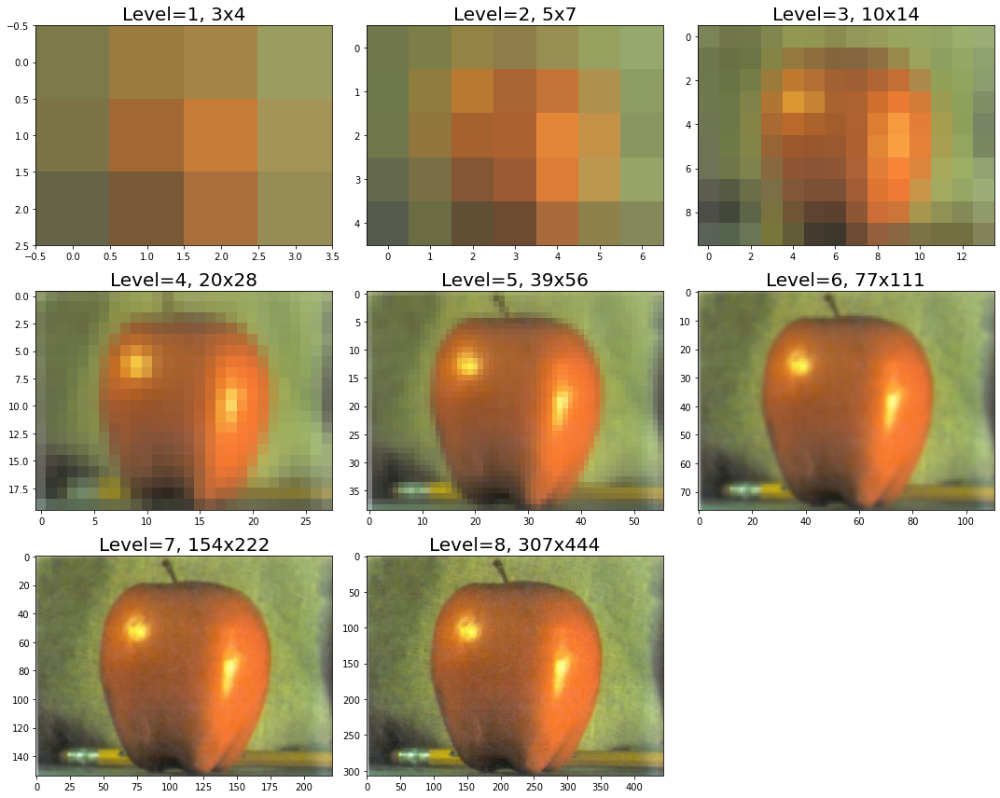

In [10]:
def reconstruct_image_from_laplacian_pyramid(pyramid):
    i = len(pyramid) - 2
    prev = pyramid[i+1]
    plt.figure(figsize=(15,12))
    j = 1
    while i >= 0:
        prev = resize(pyramid_expand(prev, upscale=2, channel_axis=2), pyramid[i].shape)
        im = np.clip(pyramid[i] + prev,0,1)
        plt.subplot(3,3,j)
        plt.imshow(im, aspect='auto')
        plt.title('Level=' + str(j) + ', ' + str(im.shape[0]) + 'x' + str(im.shape[1]), size=20)
        prev = im
        i -= 1
        j += 1
    plt.tight_layout()
    plt.show()
    return im

image = imread('images/apple.png')[...,:3] / 255
pyramid = get_laplacian_pyramid(get_gaussian_pyramid(image))
im = reconstruct_image_from_laplacian_pyramid(pyramid)

### Blending images with pyramids

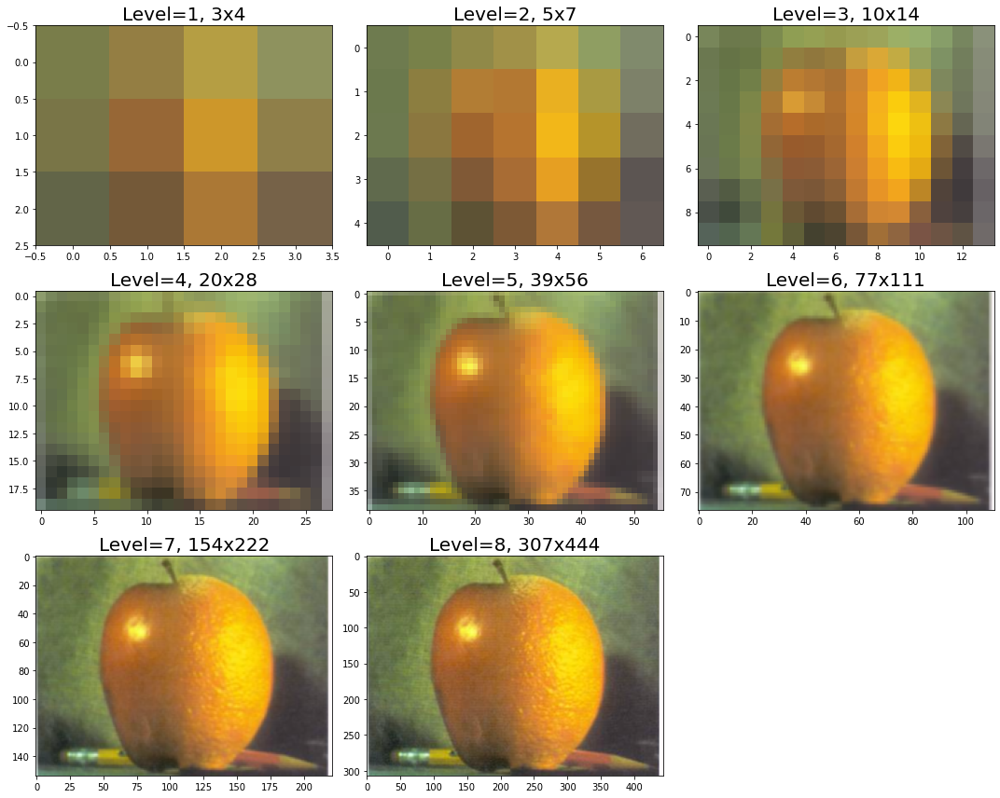

In [12]:
A = imread('images/apple.png')[...,:3] / 255
B = imread('images/orange.png')[...,:3] / 255
M = imread('images/mask.png')[...,:3] / 255

rows, cols, dim = A.shape
pyramidA = get_laplacian_pyramid(get_gaussian_pyramid(A))
pyramidB = get_laplacian_pyramid(get_gaussian_pyramid(B))
pyramidM = get_gaussian_pyramid(M)

pyramidC = []
for i in range(len(pyramidM)):
    im = pyramidM[i]*pyramidA[i] + (1-pyramidM[i])*pyramidB[i]
    #print(np.max(im), np.min(im), np.mean(im))
    pyramidC.append(im)

im = reconstruct_image_from_laplacian_pyramid(pyramidC)

In [14]:
#plt.imshow(im)
#plt.axis('off')
#plt.show()

###  Blob Detection with LoG, DoG and DoH Filters

In [6]:
## ToDo

###  Compass Edge Detectors

In [6]:
## ToDo

## Questions

1. Use the `skimage.filters` module's `unsharp_mask()` function with different values of the radius and amount parameters to sharpen an image.
2. Use the `PIL.ImageFilter` class's `UnsharpMask()` function with different values of the radius and percent parameters to sharpen an image.
3. Sharpen a color (RGB) image using the sharpen kernel $[[0, -1, 0], [-1, 5, -1], [0, -1, 0]]$. (Hint: use `scipy.signal` module's `convolve2d()` function for each of the color channels one by one.)
4. With the `scipy.ndimage` module, sharpen a color image directly (without sharpening individual color channels one by one).
5. Compute and display a Gaussian pyramid with the lena gray-scale input image using the `skimage.transform` module's `pyramid_laplacian()` function.
6. Construct the Gaussian pyramid with the `reduce()` function of the `transform` module of `scikit-image` and Laplacian pyramid from the Gaussian pyramid and `expand()` function, with the algorithm discussed.
7. Compute the Laplacian pyramid for an image and construct the original image from it.
8. Show that the LoG and DoG kernels look like a **Mexican hat** in a 3D surface plot.
9. Implement Marr and Hildreth's zero-crossing algorithm for edge detection with **LoG**.
10. Implement the non-max suppression algorithm to thin the edges in a gradient magnitude image.